In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
import pandas as pd
import os
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Step 1: Load the CSV file containing the image labels
labels_df = pd.read_csv("/content/drive/MyDrive/labels.csv")  # Adjust the file path as needed
labels_df.head()



,image,label
0,augmented_blur_00003aeb-ace5-43bf-9a0c-dc31a03...,T-shirt
1,augmented_blur_00805d0e-7fe5-4251-b577-86065e4...,T-shirt
2,augmented_blur_0090ca2c-e8c8-43f6-b764-e48e0e9...,T-shirt
3,augmented_blur_00d9cc6e-2564-4813-9d68-4bc4d56...,T-shirt
4,augmented_blur_0144d8a2-0d3b-4bee-b137-324129e...,T-shirt


In [ ]:
!unzip /content/drive/MyDrive/augmented_images.zip

In [13]:
# Get the count of unique values from a particular column
column_of_interest = 'label'  # Specify the column of interest
unique_values_count = labels_df[column_of_interest].nunique()

# Get the unique values and their counts
unique_values = labels_df[column_of_interest].value_counts()

# Display the count of unique values
print(f"\nNumber of unique values in '{column_of_interest}': {unique_values_count}")
print("\nUnique values and their counts:")
print(unique_values)



Number of unique values in 'label': 3

Unique values and their counts:
label
T-shirt    3033
Shoes      2828
Pants      2768
Name: count, dtype: int64


# Data Pre-processing and Dividing into batches


In [14]:
import os
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Define the directory containing the images
image_dir = "augmented_images"

# Split the images and labels into training, validation, and test sets
train_labels, temp_labels = train_test_split(labels_df, test_size=0.15, random_state=42)
val_labels, test_labels = train_test_split(temp_labels, test_size=0.5, random_state=42)

# Helper function to check if an image is valid
def is_valid_image(image_path):
    try:
        img = tf.io.read_file(image_path)
        img = tf.image.decode_image(img)
        return True
    except:
        return False

# Extract image paths and filter out invalid images
train_image_paths = [os.path.join(image_dir, name+'.jpg') for name in train_labels['image']]
train_image_paths = [path for path in train_image_paths if is_valid_image(path)]
val_image_paths = [os.path.join(image_dir, name+'.jpg') for name in val_labels['image']]
val_image_paths = [path for path in val_image_paths if is_valid_image(path)]
test_image_paths = [os.path.join(image_dir, name+'.jpg') for name in test_labels['image']]
test_image_paths = [path for path in test_image_paths if is_valid_image(path)]

# Filter labels based on valid image paths
train_labels = train_labels[train_labels['image'].apply(lambda x: os.path.join(image_dir, x+'.jpg') in train_image_paths)]
val_labels = val_labels[val_labels['image'].apply(lambda x: os.path.join(image_dir, x+'.jpg') in val_image_paths)]
test_labels = test_labels[test_labels['image'].apply(lambda x: os.path.join(image_dir, x+'.jpg') in test_image_paths)]

# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical format
train_labels_encoded = label_encoder.fit_transform(train_labels['label'])
val_labels_encoded = label_encoder.transform(val_labels['label'])
test_labels_encoded = label_encoder.transform(test_labels['label'])

# Number of unique classes
num_classes = len(label_encoder.classes_)

# Print original class labels before encoding
print("Original class labels:")
print(train_labels['label'].unique())

# Print original class labels after encoding
print("\nEncoded class labels:")
for idx, class_label in enumerate(label_encoder.classes_):
    print(f"{class_label}: {idx}")

batch_size = 32


Original class labels:
['Shoes' 'Pants' 'T-shirt']

Encoded class labels:
Pants: 0
Shoes: 1
T-shirt: 2


In [15]:
# Define a function to load and preprocess images
def load_and_preprocess_image(image_path, label):
    # Load image from file
    image = tf.io.read_file(image_path)
    # Decode image and convert to floating point format
    image = tf.image.decode_jpeg(image, channels=3)
    # Resize image to desired dimensions
    image = tf.image.resize(image, [64, 64])
    # Normalize pixel values to the range [-1, 1]
    image = (image - 127.5)/ 127.5
    return image, label

In [16]:
# Define a function to create a dataset from image paths and labels
def create_dataset(image_paths, labels):
    # Create a dataset from tensor slices of image paths and labels
    image_labels_dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
    # Load and preprocess images
    image_labels_dataset = image_labels_dataset.map(load_and_preprocess_image)
    # Shuffle and batch the dataset
    image_labels_dataset = image_labels_dataset.shuffle(buffer_size=1000).batch(batch_size)
    return image_labels_dataset


In [17]:
# Create datasets for training, validation, and test sets
train_dataset = create_dataset(train_image_paths, train_labels_encoded)
val_dataset = create_dataset(val_image_paths, val_labels_encoded)
test_dataset = create_dataset(test_image_paths, test_labels_encoded)
num_batches = tf.data.experimental.cardinality(train_dataset).numpy()
print(num_batches)



229


In [ ]:
# Print the shape and data types of elements in the train dataset
print("Train Dataset Element Spec:", train_dataset.element_spec)

# Iterate over the dataset and print the shape of each batch
for images, labels in train_dataset:
    print("Batch Images Shape:", images.shape)
    print("Batch Labels Shape:", labels.shape)



In [19]:
train_dataset = train_dataset.take(num_batches - 1)
num_batches = tf.data.experimental.cardinality(train_dataset).numpy()

# Print the shape of the dataset
print("Train Dataset Shape:", train_dataset.element_spec)
print(num_batches)

Train Dataset Shape: (TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))
228


# Visualization

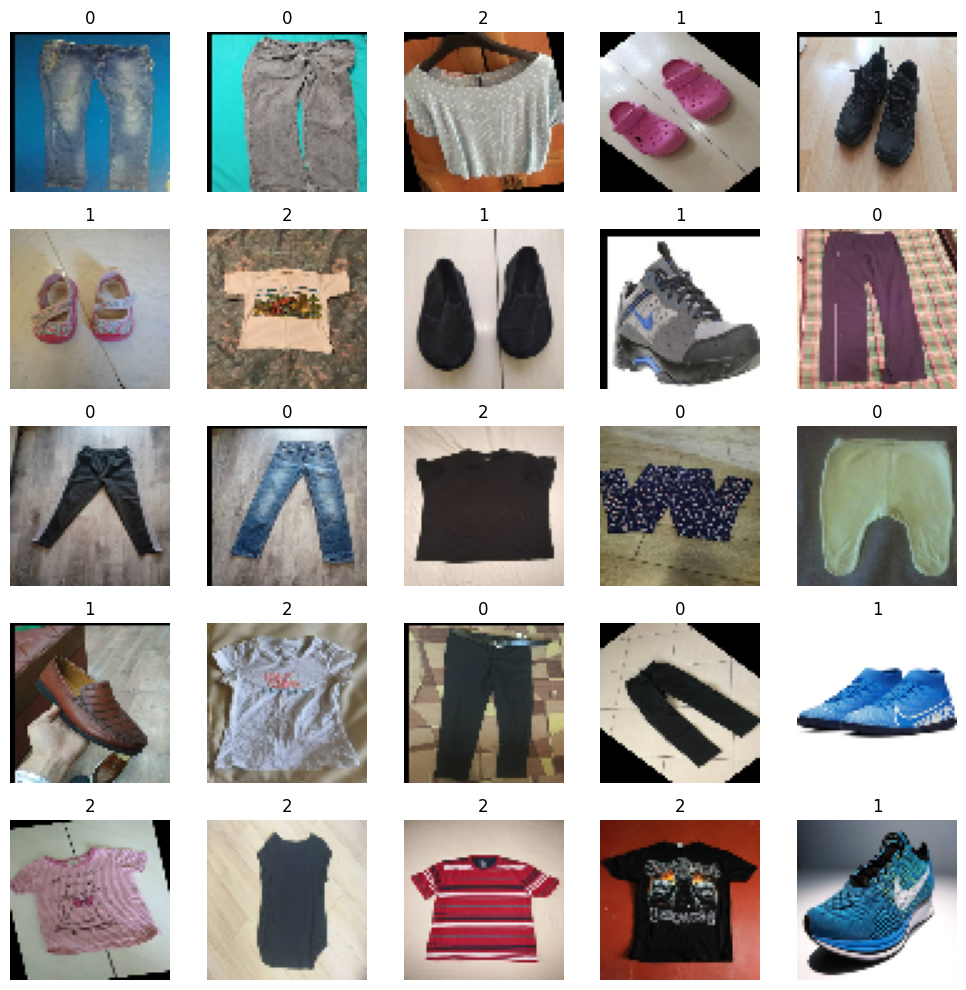

In [20]:
import matplotlib.pyplot as plt

# Function to plot images from the dataset in a grid
def plot_images(dataset, num_images, num_cols):
    # Take the first batch of images from the dataset
    for images, labels in dataset.take(1):
        # Calculate the number of rows needed
        num_rows = num_images // num_cols + (num_images % num_cols != 0)
        # Create a grid of subplots
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))
        # Plot each image
        for i, ax in enumerate(axes.flat):
            if i < num_images:
                # Convert the TensorFlow tensor to a NumPy array
                img = (images[i] + 1.0) / 2.0  # Scale pixel values to [0, 1] for display
                ax.imshow(img)
                ax.axis('off')
                ax.set_title(labels[i].numpy())  # Convert label tensor to a NumPy array and set title
            else:
                # Hide any unused subplot
                ax.axis('off')
        plt.tight_layout()  # Adjust layout to prevent overlapping
        plt.show()

# Plot images from the dataset in a grid
plot_images(train_dataset, num_images=25, num_cols=5)




In [21]:
tags = ['Pants' ,'T-shirt' ,'Shoes']
batch_size = 32
num_classes = 3
latent_dim=100

# Model Creation

In [22]:
from keras.optimizers import Adam
# Define Loss function for Classification between Real and Fake
bce_loss = tf.keras.losses.BinaryCrossentropy()

# Discriminator Loss
def discriminator_loss(real, fake):
    real_loss = bce_loss(tf.ones_like(real), real)
    fake_loss = bce_loss(tf.zeros_like(fake), fake)
    total_loss = real_loss + fake_loss
    return total_loss

# Generator Loss
def generator_loss(preds):
    return bce_loss(tf.ones_like(preds), preds)

 # Optimiser for both Generator and Dsicriminator
d_optimizer=Adam(learning_rate=0.0002, beta_1 = 0.5)
g_optimizer=Adam(learning_rate=0.0002, beta_1 = 0.5)

In [23]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import LeakyReLU, Dropout, Embedding
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, Conv2D, Flatten, Input, Concatenate, Embedding

def build_discriminator(img_shape=(64,64,3), num_classes=18):

    # Input layer for class label
    label_input = Input(shape=(1,))
    li=Embedding(num_classes, 50)(label_input)

    n_nodes=64*64
    li=Dense(n_nodes)(li)
    li= Reshape((64, 64, 1))(li)
    # Input layer for image
    img_input = Input(shape=img_shape, name="Image_Input") #64*64*3

    merge= Concatenate()([img_input,li]) # 64*64*4

    disc = Conv2D(128, (4,4), strides=(2,2), padding='same')(merge)
    disc = LeakyReLU(alpha=0.2)(disc)
    # disc = Conv2D(128, (4,4), strides=(2,2), padding='same')(disc)
    # disc = LeakyReLU(alpha=0.2)(disc)
    disc = Conv2D(64, (4,4), strides=(2,2), padding='same')(disc)
    disc = LeakyReLU(alpha=0.2)(disc)
    disc = Flatten()(disc)
    disc = Dropout(0.4)(disc)

    # Output layer
    out_layer = Dense(1, activation='sigmoid')(disc)

    model = Model([img_input, label_input], out_layer)

    return model

d_model=build_discriminator()
d_model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 1)]                  0         []                            
                                                                                                  
 embedding (Embedding)       (None, 1, 50)                900       ['input_1[0][0]']             
                                                                                                  
 dense (Dense)               (None, 1, 4096)              208896    ['embedding[0][0]']           
                                                                                                  
 Image_Input (InputLayer)    [(None, 64, 64, 3)]          0         []                            
                                                                                              

In [24]:
def build_generator():
    # Input layer for class label
    label_input = Input(shape=(1,))
    li=Embedding(num_classes, 50)(label_input)

    n_nodes=8*8
    li=Dense(n_nodes)(li)
    li= Reshape((8,8,1))(li)
    in_lat = Input(shape=(latent_dim,)) #latent vector input

    n_nodes=128*8*8

    gen=Dense(n_nodes)(in_lat)
    gen=LeakyReLU(alpha=0.2)(gen)
    gen=Reshape((8, 8, 128))(gen)

    # Concatenate noise and label inputs
    combined_input = Concatenate()([gen, li])
    gen=Conv2DTranspose(256, kernel_size=4, strides=2, padding='same')(combined_input)
    gen=LeakyReLU(alpha=0.2)(gen)
    # gen=Conv2DTranspose(256, kernel_size=5, strides=1, padding='same')(gen)
    # gen=LeakyReLU(alpha=0.2)(gen)
    gen=Conv2DTranspose(128, kernel_size=4, strides=2, padding='same')(gen)
    gen=LeakyReLU(alpha=0.2)(gen)
    # gen=Conv2DTranspose(128, kernel_size=5, strides=1, padding='same')(gen)
    # gen=LeakyReLU(alpha=0.2)(gen)
    gen=Conv2DTranspose(64, kernel_size=4, strides=2, padding='same')(gen)
    gen=LeakyReLU(alpha=0.2)(gen)

    # Output layer
    out_layer=Conv2D(3, kernel_size=8, padding='same', activation='tanh')(gen)

    model= Model([in_lat, label_input], out_layer)
    return model

g_model= build_generator()
g_model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 100)]                0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 1)]                  0         []                            
                                                                                                  
 dense_3 (Dense)             (None, 8192)                 827392    ['input_3[0][0]']             
                                                                                                  
 embedding_1 (Embedding)     (None, 1, 50)                150       ['input_2[0][0]']             
                                                                                            

In [25]:
# Compiles the train_step function into a callable TensorFlow graph
@tf.function
def train_step(dataset):

    real_images, real_labels = dataset
    # Sample random points in the latent space and concatenate the labels.
    random_latent_vectors = tf.random.normal(shape=(batch_size, latent_dim))
    generated_images = g_model([random_latent_vectors, real_labels])

    # Train the discriminator.
    with tf.GradientTape() as tape:
        pred_fake = d_model([generated_images, real_labels])
        pred_real = d_model([real_images, real_labels])

        d_loss = discriminator_loss(pred_real, pred_fake)

    grads = tape.gradient(d_loss, d_model.trainable_variables)
    # print(grads)
    d_optimizer.apply_gradients(zip(grads, d_model.trainable_variables))

    # Sample random points in the latent space.
    random_latent_vectors = tf.random.normal(shape=(batch_size, latent_dim))

    # Train the generator
    with tf.GradientTape() as tape:
        fake_images = g_model([random_latent_vectors, real_labels])
        predictions = d_model([fake_images, real_labels])
        g_loss = generator_loss(predictions)

    grads = tape.gradient(g_loss, g_model.trainable_variables)
    g_optimizer.apply_gradients(zip(grads, g_model.trainable_variables))

    return d_loss, g_loss

In [26]:
import numpy as np

def show_samples(num_samples, n_class, g_model):
    fig, axes = plt.subplots(n_class, num_samples, figsize=(1*num_samples, 1*n_class))
    fig.tight_layout()
    fig.subplots_adjust(wspace=None, hspace=0.05)

    for l in range(n_class):
        random_noise = tf.random.normal(shape=(num_samples, latent_dim))
        label = tf.ones(num_samples) * l
        gen_imgs = g_model.predict([random_noise, label])

        for j in range(num_samples):
            # Ensure pixel values are within the valid range [0, 1]
            gen_imgs[j] = (gen_imgs[j] + 1.0) / 2.0

            # Plot the generated image
            axes[l,j].imshow(gen_imgs[j])
            axes[l,j].yaxis.set_ticks([])
            axes[l,j].xaxis.set_ticks([])

            if j == 0:
                axes[l,j].set_ylabel(f'Class: {l}')

    plt.show()



In [29]:
import time
from tqdm import tqdm
d_losses = []  # List to store discriminator losses
g_losses = []  # List to store generator losses
def train(dataset, epochs):

	for epoch in range(epochs):
		print('Epoch: ', epochs)
		d_loss_list = []
		g_loss_list = []
		q_loss_list = []
		start = time.time()

		itern = 0
		for image_batch in tqdm(dataset):
			d_loss, g_loss = train_step(image_batch)
			d_loss_list.append(d_loss)
			g_loss_list.append(g_loss)
			itern=itern+1

		# Average losses for the epoch
		d_loss_epoch = np.mean(d_loss_list)
		g_loss_epoch = np.mean(g_loss_list)

		d_losses.append(d_loss_epoch)
		g_losses.append(g_loss_epoch)

		show_samples(3, num_classes, g_model)

		print (f'Epoch: {epoch} -- G_Loss: {np.mean(g_loss_list)}, D_Loss: {np.mean(d_loss_list)}\n')
		print (f'Took {time.time()-start} seconds. \n\n')




# cGAN Training

Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 19ms/step


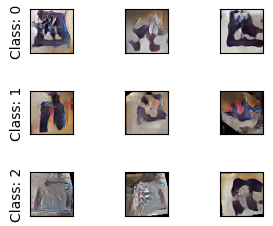

Epoch: 0 -- G_Loss: 1.186581015586853, D_Loss: 1.0901800394058228

Took 21.166232347488403 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 15.05it/s]


1/1 [==============================] - 0s 19ms/step


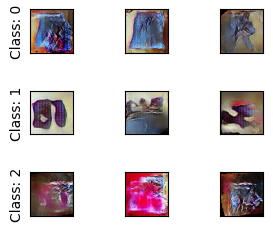

Epoch: 1 -- G_Loss: 1.1992357969284058, D_Loss: 1.0712848901748657

Took 15.810806512832642 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 19ms/step


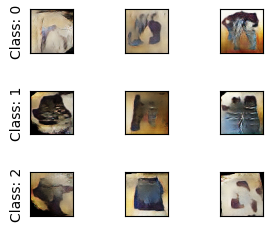

Epoch: 2 -- G_Loss: 1.1976237297058105, D_Loss: 1.0824190378189087

Took 21.150044202804565 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.65it/s]


1/1 [==============================] - 0s 18ms/step


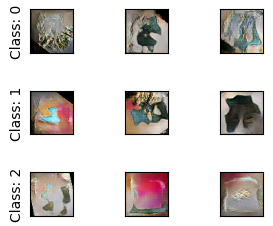

Epoch: 3 -- G_Loss: 1.1761764287948608, D_Loss: 1.0803557634353638

Took 16.61872148513794 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.75it/s]


1/1 [==============================] - 0s 18ms/step


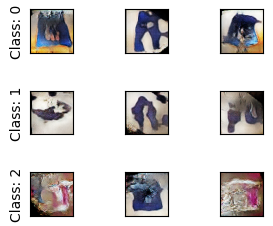

Epoch: 4 -- G_Loss: 1.2062153816223145, D_Loss: 1.0798594951629639

Took 18.583029985427856 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.73it/s]


1/1 [==============================] - 0s 20ms/step


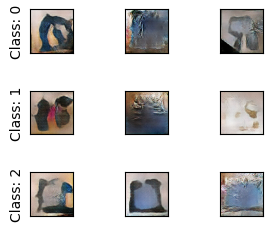

Epoch: 5 -- G_Loss: 1.1716721057891846, D_Loss: 1.0968806743621826

Took 16.206539154052734 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.91it/s]


1/1 [==============================] - 0s 22ms/step


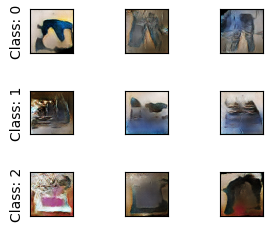

Epoch: 6 -- G_Loss: 1.2205333709716797, D_Loss: 1.1057558059692383

Took 16.012624263763428 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 19ms/step


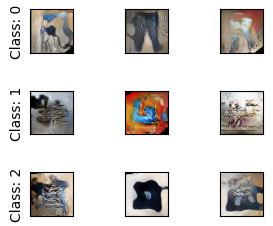

Epoch: 7 -- G_Loss: 1.166541337966919, D_Loss: 1.0865774154663086

Took 21.15869641304016 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.93it/s]


1/1 [==============================] - 0s 18ms/step


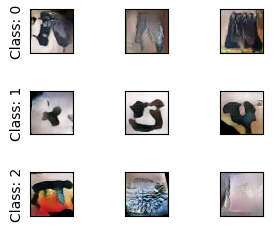

Epoch: 8 -- G_Loss: 1.1821060180664062, D_Loss: 1.0893518924713135

Took 15.991511106491089 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.62it/s]


1/1 [==============================] - 0s 18ms/step


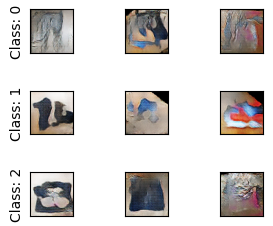

Epoch: 9 -- G_Loss: 1.1694098711013794, D_Loss: 1.101241946220398

Took 15.614980936050415 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:13<00:00, 16.50it/s]


1/1 [==============================] - 0s 44ms/step


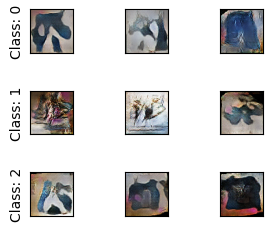

Epoch: 10 -- G_Loss: 1.1813764572143555, D_Loss: 1.0928502082824707

Took 15.537545919418335 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:13<00:00, 16.45it/s]


1/1 [==============================] - 0s 31ms/step


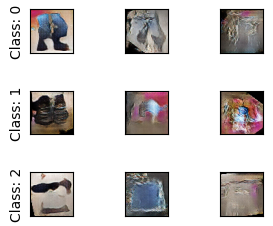

Epoch: 11 -- G_Loss: 1.1823030710220337, D_Loss: 1.091386079788208

Took 15.0321786403656 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.08it/s]


1/1 [==============================] - 0s 32ms/step


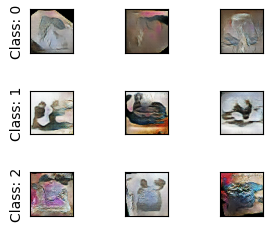

Epoch: 12 -- G_Loss: 1.2108253240585327, D_Loss: 1.1029976606369019

Took 18.66260051727295 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 16.15it/s]


1/1 [==============================] - 0s 31ms/step


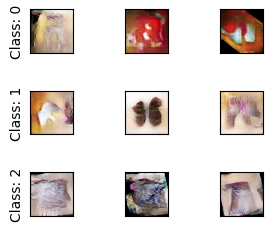

Epoch: 13 -- G_Loss: 1.1827210187911987, D_Loss: 1.074280023574829

Took 15.287781238555908 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 18ms/step


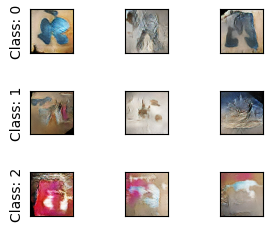

Epoch: 14 -- G_Loss: 1.1810225248336792, D_Loss: 1.0834343433380127

Took 21.168359756469727 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.25it/s]


1/1 [==============================] - 0s 19ms/step


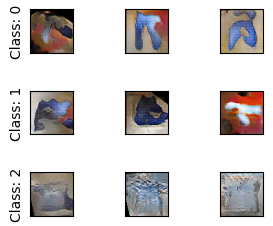

Epoch: 15 -- G_Loss: 1.1679449081420898, D_Loss: 1.0830159187316895

Took 15.68880558013916 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 16.24it/s]


1/1 [==============================] - 0s 33ms/step


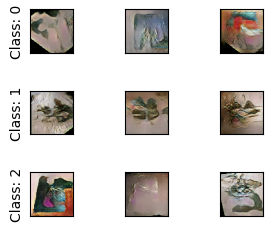

Epoch: 16 -- G_Loss: 1.1998080015182495, D_Loss: 1.0898374319076538

Took 15.29484486579895 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:13<00:00, 16.40it/s]


1/1 [==============================] - 0s 37ms/step


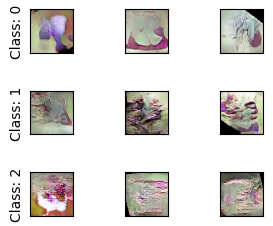

Epoch: 17 -- G_Loss: 1.2188053131103516, D_Loss: 1.089525580406189

Took 15.544277429580688 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 16.06it/s]


1/1 [==============================] - 0s 29ms/step


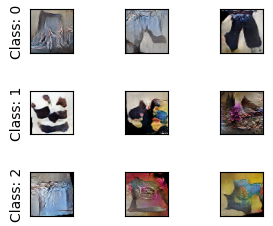

Epoch: 18 -- G_Loss: 1.2252317667007446, D_Loss: 1.0989974737167358

Took 15.319765329360962 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.44it/s]


1/1 [==============================] - 0s 29ms/step


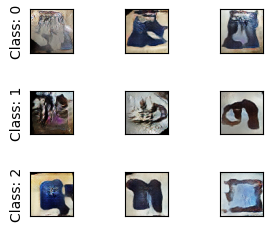

Epoch: 19 -- G_Loss: 1.1488484144210815, D_Loss: 1.087415337562561

Took 15.789535999298096 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.77it/s]


1/1 [==============================] - 0s 30ms/step


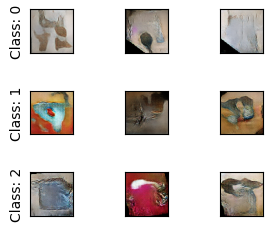

Epoch: 20 -- G_Loss: 1.1961445808410645, D_Loss: 1.0914576053619385

Took 16.498632192611694 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.39it/s]


1/1 [==============================] - 0s 18ms/step


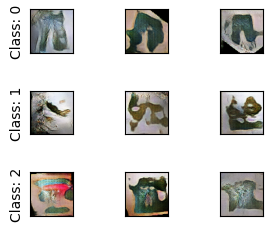

Epoch: 21 -- G_Loss: 1.2199934720993042, D_Loss: 1.0925155878067017

Took 16.597368717193604 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.21it/s]


1/1 [==============================] - 0s 18ms/step


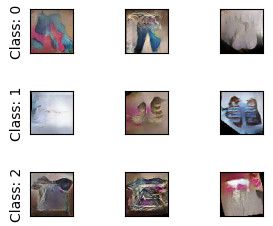

Epoch: 22 -- G_Loss: 1.1452574729919434, D_Loss: 1.0903092622756958

Took 16.752612352371216 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.36it/s]


1/1 [==============================] - 0s 18ms/step


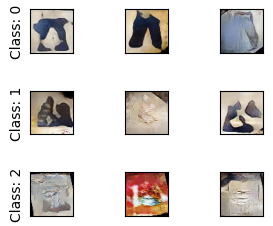

Epoch: 23 -- G_Loss: 1.2236918210983276, D_Loss: 1.0995110273361206

Took 16.595206260681152 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.53it/s]


1/1 [==============================] - 0s 20ms/step


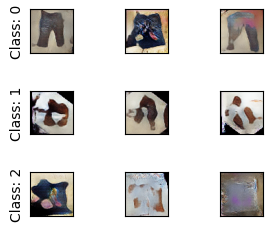

Epoch: 24 -- G_Loss: 1.1683056354522705, D_Loss: 1.085071325302124

Took 16.735634803771973 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.70it/s]


1/1 [==============================] - 0s 18ms/step


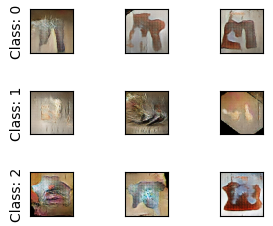

Epoch: 25 -- G_Loss: 1.280538558959961, D_Loss: 1.0969774723052979

Took 16.23890495300293 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.81it/s]


1/1 [==============================] - 0s 41ms/step


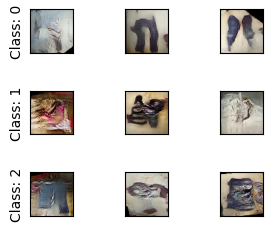

Epoch: 26 -- G_Loss: 1.1846259832382202, D_Loss: 1.074954867362976

Took 15.643562316894531 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:13<00:00, 16.49it/s]


1/1 [==============================] - 0s 41ms/step


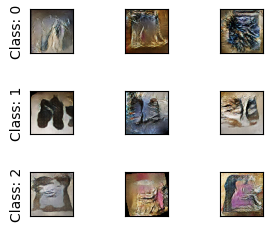

Epoch: 27 -- G_Loss: 1.228178858757019, D_Loss: 1.11200749874115

Took 15.010674715042114 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.96it/s]


1/1 [==============================] - 0s 33ms/step


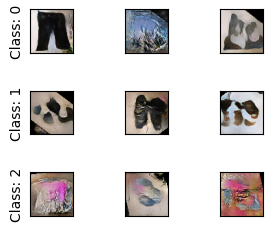

Epoch: 28 -- G_Loss: 1.1556460857391357, D_Loss: 1.1021414995193481

Took 15.304537296295166 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.04it/s]


1/1 [==============================] - 0s 46ms/step


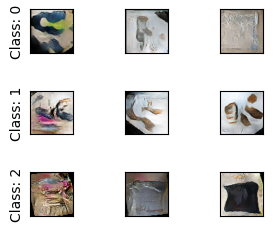

Epoch: 29 -- G_Loss: 1.1646713018417358, D_Loss: 1.0866014957427979

Took 17.48485279083252 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.42it/s]


1/1 [==============================] - 0s 40ms/step


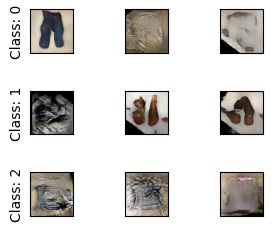

Epoch: 30 -- G_Loss: 1.1626425981521606, D_Loss: 1.0860583782196045

Took 18.336942195892334 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.93it/s]


1/1 [==============================] - 0s 19ms/step


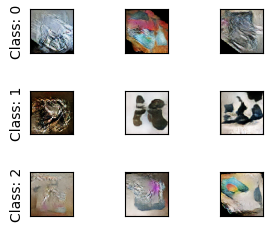

Epoch: 31 -- G_Loss: 1.215790033340454, D_Loss: 1.0948047637939453

Took 18.68710422515869 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.20it/s]


1/1 [==============================] - 0s 19ms/step


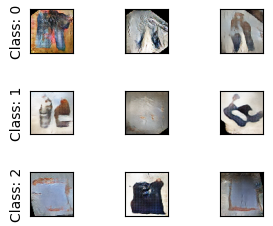

Epoch: 32 -- G_Loss: 1.1596636772155762, D_Loss: 1.102349877357483

Took 16.876314640045166 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.42it/s]


1/1 [==============================] - 0s 19ms/step


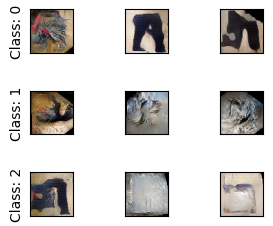

Epoch: 33 -- G_Loss: 1.1731958389282227, D_Loss: 1.0924968719482422

Took 16.595052480697632 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.28it/s]


1/1 [==============================] - 0s 35ms/step


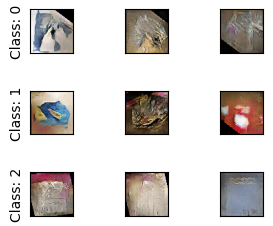

Epoch: 34 -- G_Loss: 1.2448111772537231, D_Loss: 1.1037958860397339

Took 16.192708253860474 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 16.09it/s]


1/1 [==============================] - 0s 31ms/step


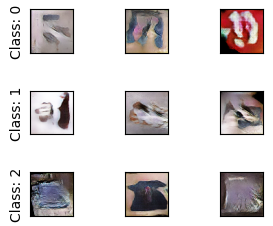

Epoch: 35 -- G_Loss: 1.142971396446228, D_Loss: 1.0850647687911987

Took 15.333532571792603 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 18ms/step


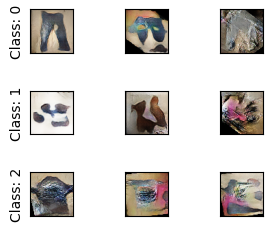

Epoch: 36 -- G_Loss: 1.2075526714324951, D_Loss: 1.1087427139282227

Took 21.231797695159912 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 15.11it/s]


1/1 [==============================] - 0s 23ms/step


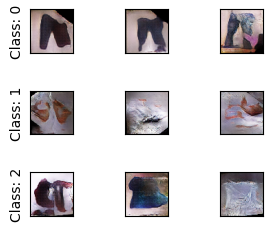

Epoch: 37 -- G_Loss: 1.1277211904525757, D_Loss: 1.0978670120239258

Took 16.13404417037964 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 16.23it/s]


1/1 [==============================] - 0s 30ms/step


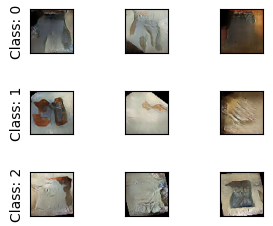

Epoch: 38 -- G_Loss: 1.1380702257156372, D_Loss: 1.0979994535446167

Took 15.809528350830078 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 20ms/step


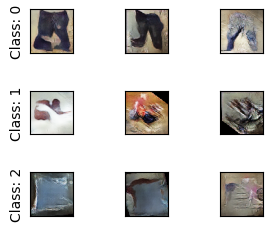

Epoch: 39 -- G_Loss: 1.1963732242584229, D_Loss: 1.1039429903030396

Took 21.240856409072876 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.22it/s]


1/1 [==============================] - 0s 22ms/step


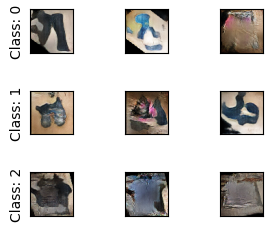

Epoch: 40 -- G_Loss: 1.1340831518173218, D_Loss: 1.1117024421691895

Took 16.828264236450195 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.57it/s]


1/1 [==============================] - 0s 49ms/step


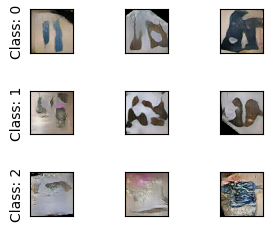

Epoch: 41 -- G_Loss: 1.154756784439087, D_Loss: 1.1000431776046753

Took 15.951646327972412 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 16.23it/s]


1/1 [==============================] - 0s 27ms/step


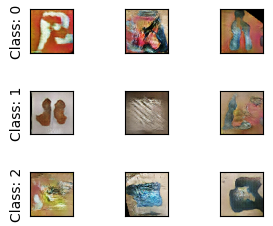

Epoch: 42 -- G_Loss: 1.184444785118103, D_Loss: 1.121217131614685

Took 15.155617475509644 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.49it/s]


1/1 [==============================] - 0s 34ms/step


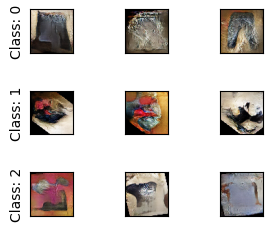

Epoch: 43 -- G_Loss: 1.1471896171569824, D_Loss: 1.115390419960022

Took 15.823558568954468 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.70it/s]


1/1 [==============================] - 0s 30ms/step


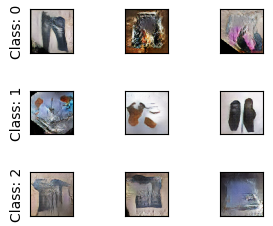

Epoch: 44 -- G_Loss: 1.1508021354675293, D_Loss: 1.1157877445220947

Took 16.45869517326355 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.96it/s]


1/1 [==============================] - 0s 20ms/step


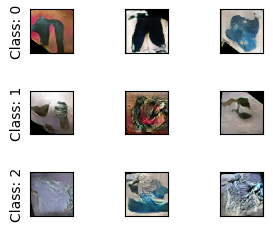

Epoch: 45 -- G_Loss: 1.1577712297439575, D_Loss: 1.1059781312942505

Took 17.42715835571289 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.83it/s]


1/1 [==============================] - 0s 21ms/step


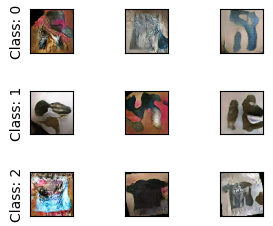

Epoch: 46 -- G_Loss: 1.1506749391555786, D_Loss: 1.1044700145721436

Took 17.29879355430603 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.00it/s]


1/1 [==============================] - 0s 22ms/step


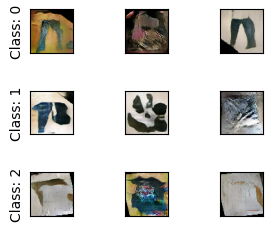

Epoch: 47 -- G_Loss: 1.181095838546753, D_Loss: 1.1048924922943115

Took 17.08037781715393 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.64it/s]


1/1 [==============================] - 0s 28ms/step


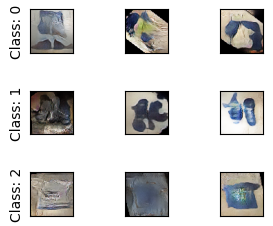

Epoch: 48 -- G_Loss: 1.1416208744049072, D_Loss: 1.1144170761108398

Took 16.679800748825073 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.02it/s]


1/1 [==============================] - 0s 27ms/step


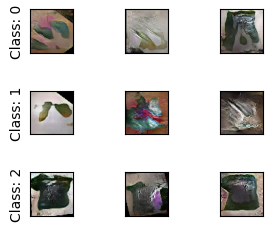

Epoch: 49 -- G_Loss: 1.1754661798477173, D_Loss: 1.1179001331329346

Took 19.772850036621094 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.36it/s]


1/1 [==============================] - 0s 47ms/step


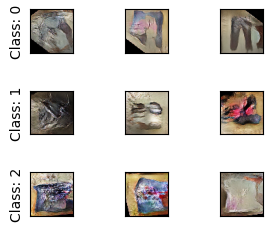

Epoch: 50 -- G_Loss: 1.1307740211486816, D_Loss: 1.1085116863250732

Took 16.062773942947388 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 18ms/step


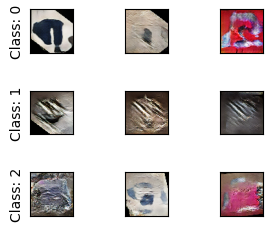

Epoch: 51 -- G_Loss: 1.262120008468628, D_Loss: 1.1415244340896606

Took 21.2963809967041 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 25ms/step


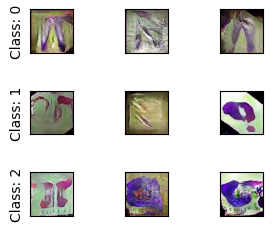

Epoch: 52 -- G_Loss: 1.120958685874939, D_Loss: 1.1073284149169922

Took 21.24393081665039 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.04it/s]


1/1 [==============================] - 0s 31ms/step


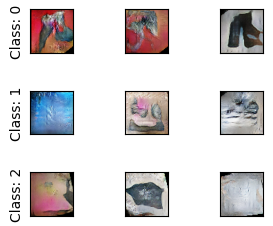

Epoch: 53 -- G_Loss: 1.1520746946334839, D_Loss: 1.1093066930770874

Took 17.402649402618408 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.59it/s]


1/1 [==============================] - 0s 26ms/step


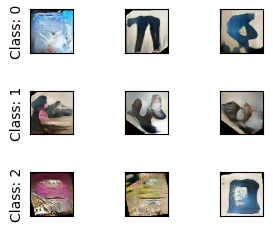

Epoch: 54 -- G_Loss: 1.1213113069534302, D_Loss: 1.1206377744674683

Took 16.643447637557983 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.82it/s]


1/1 [==============================] - 0s 31ms/step


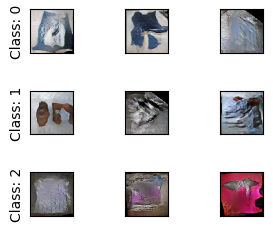

Epoch: 55 -- G_Loss: 1.1317646503448486, D_Loss: 1.1129322052001953

Took 16.6505925655365 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 43ms/step


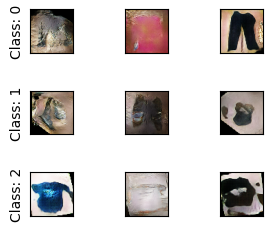

Epoch: 56 -- G_Loss: 1.1802520751953125, D_Loss: 1.1214402914047241

Took 21.286856174468994 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.45it/s]


1/1 [==============================] - 0s 28ms/step


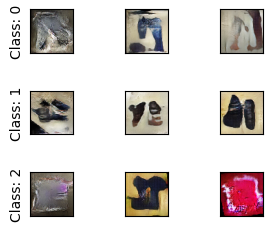

Epoch: 57 -- G_Loss: 1.1488004922866821, D_Loss: 1.1121453046798706

Took 16.595032930374146 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.68it/s]


1/1 [==============================] - 0s 58ms/step


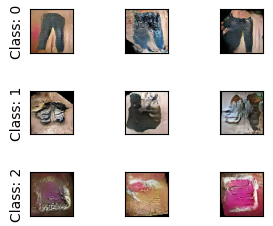

Epoch: 58 -- G_Loss: 1.1286184787750244, D_Loss: 1.1066871881484985

Took 15.827261924743652 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.54it/s]


1/1 [==============================] - 0s 33ms/step


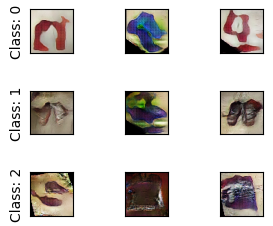

Epoch: 59 -- G_Loss: 1.1163400411605835, D_Loss: 1.1141529083251953

Took 16.194057941436768 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 15.05it/s]


1/1 [==============================] - 0s 26ms/step


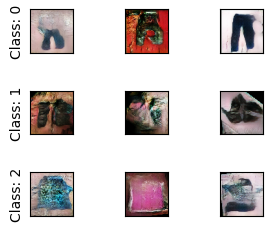

Epoch: 60 -- G_Loss: 1.2230315208435059, D_Loss: 1.1176198720932007

Took 16.238803386688232 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.97it/s]


1/1 [==============================] - 0s 29ms/step


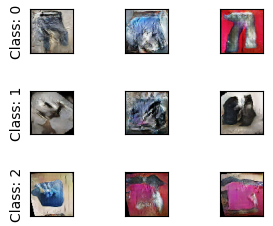

Epoch: 61 -- G_Loss: 1.1172353029251099, D_Loss: 1.1341476440429688

Took 17.179675817489624 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.52it/s]


1/1 [==============================] - 0s 31ms/step


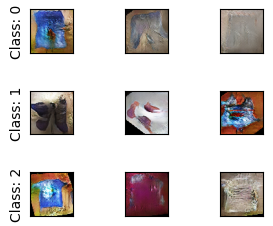

Epoch: 62 -- G_Loss: 1.0959582328796387, D_Loss: 1.1267963647842407

Took 17.727866888046265 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.45it/s]


1/1 [==============================] - 0s 32ms/step


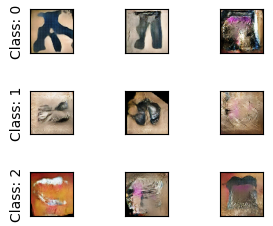

Epoch: 63 -- G_Loss: 1.1424392461776733, D_Loss: 1.1350890398025513

Took 17.837804079055786 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.81it/s]


1/1 [==============================] - 0s 31ms/step


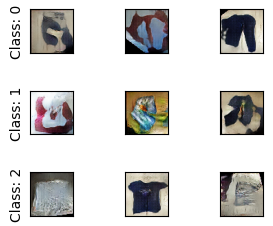

Epoch: 64 -- G_Loss: 1.1461782455444336, D_Loss: 1.1310697793960571

Took 17.349135637283325 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 40ms/step


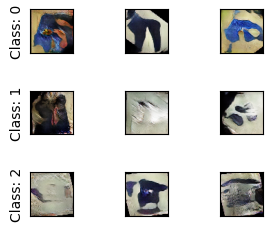

Epoch: 65 -- G_Loss: 1.2170765399932861, D_Loss: 1.129345178604126

Took 21.520495414733887 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.70it/s]


1/1 [==============================] - 0s 29ms/step


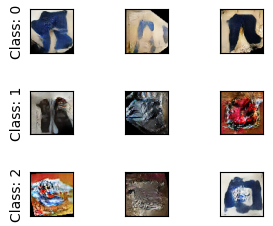

Epoch: 66 -- G_Loss: 1.1309443712234497, D_Loss: 1.1259561777114868

Took 20.664531230926514 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.17it/s]


1/1 [==============================] - 0s 36ms/step


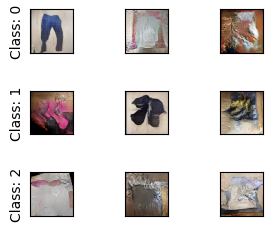

Epoch: 67 -- G_Loss: 1.0962096452713013, D_Loss: 1.1442034244537354

Took 17.34481191635132 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:14<00:00, 15.67it/s]


1/1 [==============================] - 0s 58ms/step


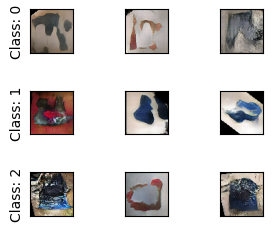

Epoch: 68 -- G_Loss: 1.1030598878860474, D_Loss: 1.12405526638031

Took 15.801328897476196 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.75it/s]


1/1 [==============================] - 0s 49ms/step


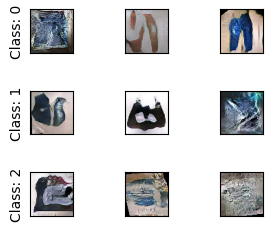

Epoch: 69 -- G_Loss: 1.1211538314819336, D_Loss: 1.1339235305786133

Took 16.614811182022095 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.91it/s]


1/1 [==============================] - 0s 41ms/step


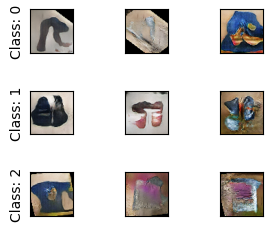

Epoch: 70 -- G_Loss: 1.1316945552825928, D_Loss: 1.1398710012435913

Took 17.343551635742188 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.07it/s]


1/1 [==============================] - 0s 29ms/step


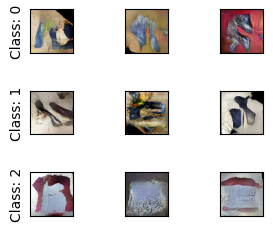

Epoch: 71 -- G_Loss: 1.0899791717529297, D_Loss: 1.151120901107788

Took 21.46117401123047 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.51it/s]


1/1 [==============================] - 0s 28ms/step


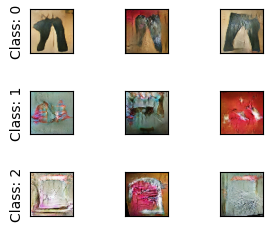

Epoch: 72 -- G_Loss: 1.1111268997192383, D_Loss: 1.129090666770935

Took 17.77115488052368 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.83it/s]


1/1 [==============================] - 0s 36ms/step


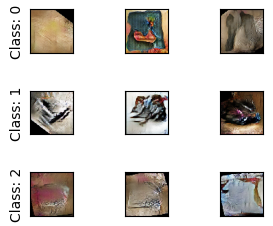

Epoch: 73 -- G_Loss: 1.1385233402252197, D_Loss: 1.146018624305725

Took 17.01375913619995 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.92it/s]


1/1 [==============================] - 0s 44ms/step


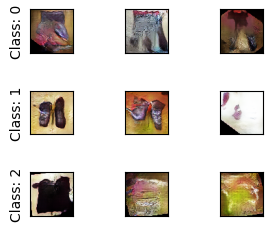

Epoch: 74 -- G_Loss: 1.1025408506393433, D_Loss: 1.143439531326294

Took 16.586915254592896 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 35ms/step


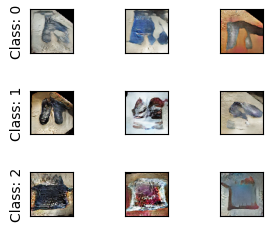

Epoch: 75 -- G_Loss: 1.1696044206619263, D_Loss: 1.14627206325531

Took 21.350618839263916 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 27ms/step


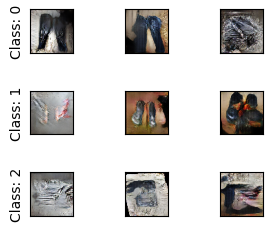

Epoch: 76 -- G_Loss: 1.1092523336410522, D_Loss: 1.1499615907669067

Took 21.305468797683716 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.46it/s]


1/1 [==============================] - 0s 28ms/step


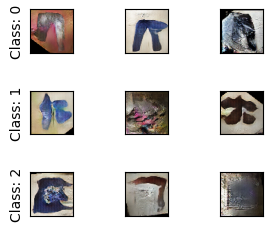

Epoch: 77 -- G_Loss: 1.1345934867858887, D_Loss: 1.1454861164093018

Took 17.799175262451172 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 31ms/step


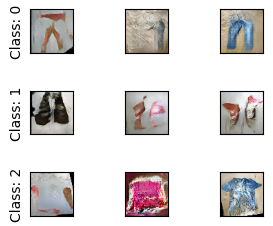

Epoch: 78 -- G_Loss: 1.1143980026245117, D_Loss: 1.135196566581726

Took 21.29876399040222 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.40it/s]


1/1 [==============================] - 0s 27ms/step


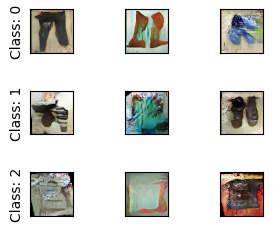

Epoch: 79 -- G_Loss: 1.1070506572723389, D_Loss: 1.1375515460968018

Took 17.89333724975586 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.74it/s]


1/1 [==============================] - 0s 46ms/step


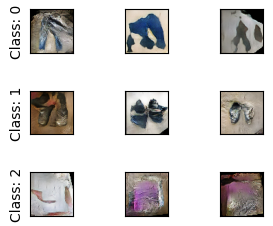

Epoch: 80 -- G_Loss: 1.1230895519256592, D_Loss: 1.1460379362106323

Took 16.83504319190979 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.13it/s]


1/1 [==============================] - 0s 32ms/step


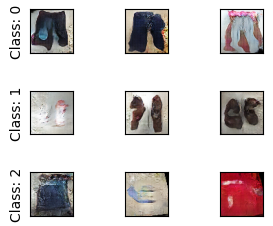

Epoch: 81 -- G_Loss: 1.1060521602630615, D_Loss: 1.1444423198699951

Took 17.374146699905396 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.79it/s]


1/1 [==============================] - 0s 36ms/step


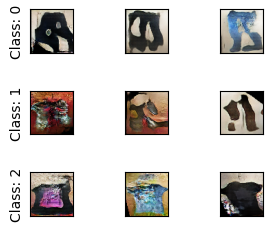

Epoch: 82 -- G_Loss: 1.1489558219909668, D_Loss: 1.1457428932189941

Took 19.093953847885132 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.03it/s]


1/1 [==============================] - 0s 31ms/step


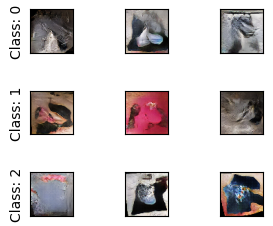

Epoch: 83 -- G_Loss: 1.1239391565322876, D_Loss: 1.1440764665603638

Took 18.400615692138672 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.75it/s]


1/1 [==============================] - 0s 42ms/step


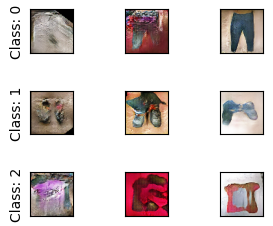

Epoch: 84 -- G_Loss: 1.0868072509765625, D_Loss: 1.1518733501434326

Took 18.82777976989746 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.22it/s]


1/1 [==============================] - 0s 29ms/step


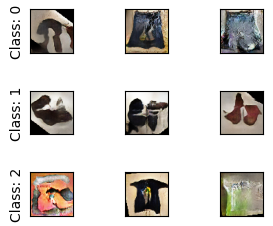

Epoch: 85 -- G_Loss: 1.135406255722046, D_Loss: 1.1577987670898438

Took 18.104331016540527 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.23it/s]


1/1 [==============================] - 0s 30ms/step


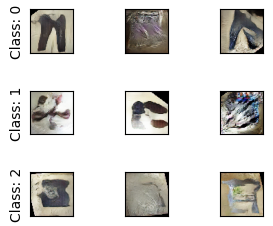

Epoch: 86 -- G_Loss: 1.1239815950393677, D_Loss: 1.1523022651672363

Took 17.333470106124878 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:15<00:00, 14.57it/s]


1/1 [==============================] - 0s 28ms/step


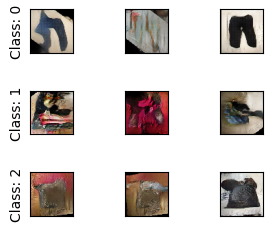

Epoch: 87 -- G_Loss: 1.057665467262268, D_Loss: 1.1537258625030518

Took 17.164597511291504 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.13it/s]


1/1 [==============================] - 0s 38ms/step


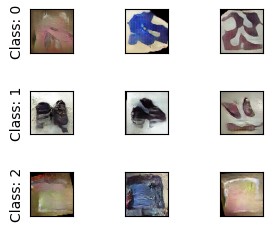

Epoch: 88 -- G_Loss: 1.1086539030075073, D_Loss: 1.1566017866134644

Took 17.320124626159668 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.49it/s]


1/1 [==============================] - 0s 33ms/step


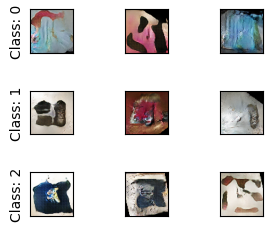

Epoch: 89 -- G_Loss: 1.1054939031600952, D_Loss: 1.1570228338241577

Took 19.463337898254395 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.99it/s]


1/1 [==============================] - 0s 35ms/step


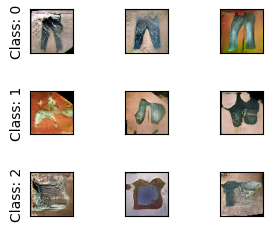

Epoch: 90 -- G_Loss: 1.0740009546279907, D_Loss: 1.1534759998321533

Took 18.4947190284729 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:21<00:00, 10.84it/s]


1/1 [==============================] - 0s 28ms/step


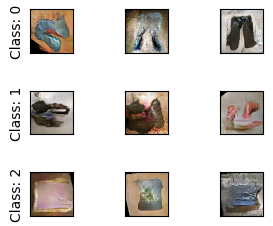

Epoch: 91 -- G_Loss: 1.1202640533447266, D_Loss: 1.1490639448165894

Took 22.02366590499878 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 30ms/step


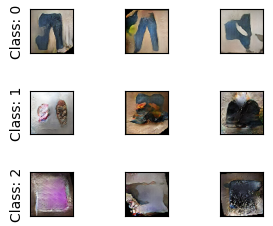

Epoch: 92 -- G_Loss: 1.089741826057434, D_Loss: 1.166353464126587

Took 21.391308546066284 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 27ms/step


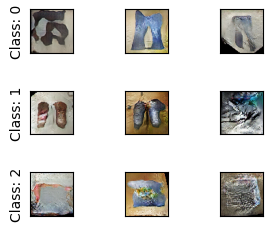

Epoch: 93 -- G_Loss: 1.0904347896575928, D_Loss: 1.1536316871643066

Took 21.313908576965332 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.30it/s]


1/1 [==============================] - 0s 30ms/step


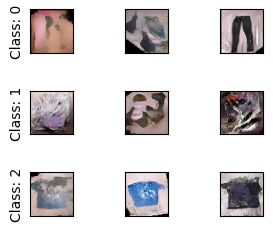

Epoch: 94 -- G_Loss: 1.088267207145691, D_Loss: 1.16866934299469

Took 18.39799427986145 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.15it/s]


1/1 [==============================] - 0s 43ms/step


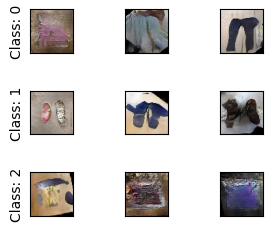

Epoch: 95 -- G_Loss: 1.1263881921768188, D_Loss: 1.1484320163726807

Took 17.52208375930786 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.98it/s]


1/1 [==============================] - 0s 35ms/step


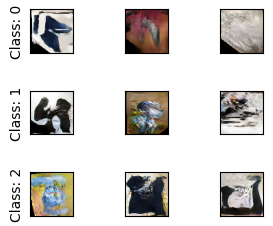

Epoch: 96 -- G_Loss: 1.1270331144332886, D_Loss: 1.175999641418457

Took 17.564162731170654 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.68it/s]


1/1 [==============================] - 0s 43ms/step


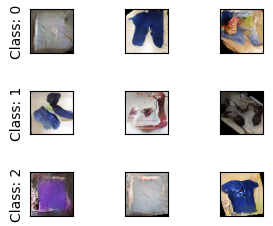

Epoch: 97 -- G_Loss: 1.077224612236023, D_Loss: 1.1484824419021606

Took 17.948051929473877 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.12it/s]


1/1 [==============================] - 0s 49ms/step


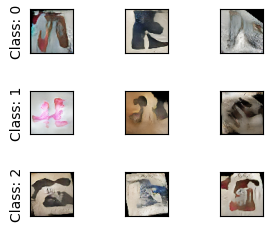

Epoch: 98 -- G_Loss: 1.0636005401611328, D_Loss: 1.167231798171997

Took 18.610134601593018 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.27it/s]


1/1 [==============================] - 0s 30ms/step


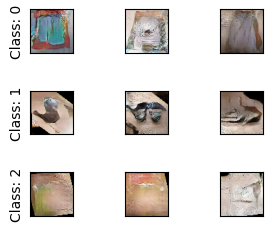

Epoch: 99 -- G_Loss: 1.0775885581970215, D_Loss: 1.1584975719451904

Took 21.07367444038391 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.68it/s]


1/1 [==============================] - 0s 35ms/step


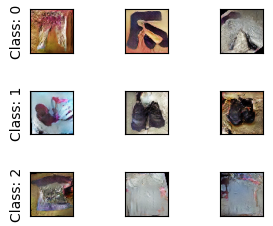

Epoch: 100 -- G_Loss: 1.1379488706588745, D_Loss: 1.1820911169052124

Took 18.950248956680298 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.40it/s]


1/1 [==============================] - 0s 42ms/step


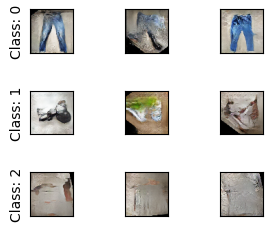

Epoch: 101 -- G_Loss: 1.0860955715179443, D_Loss: 1.1536953449249268

Took 19.002833366394043 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 14.16it/s]


1/1 [==============================] - 0s 37ms/step


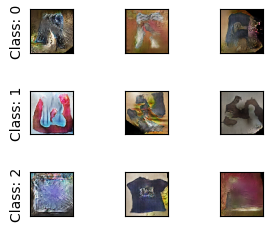

Epoch: 102 -- G_Loss: 1.0507005453109741, D_Loss: 1.1629767417907715

Took 17.34461545944214 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:16<00:00, 13.61it/s]


1/1 [==============================] - 0s 40ms/step


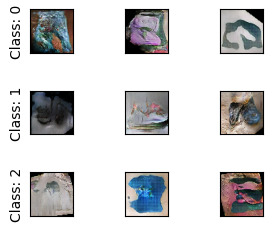

Epoch: 103 -- G_Loss: 1.1290479898452759, D_Loss: 1.1823993921279907

Took 17.982874870300293 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.99it/s]


1/1 [==============================] - 0s 35ms/step


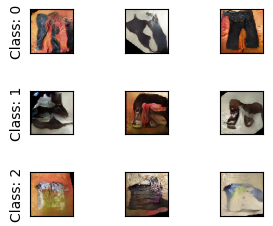

Epoch: 104 -- G_Loss: 1.0826115608215332, D_Loss: 1.165073037147522

Took 18.655034065246582 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.66it/s]


1/1 [==============================] - 0s 29ms/step


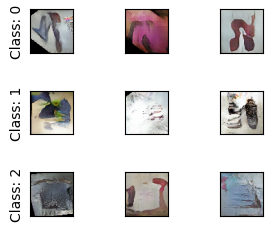

Epoch: 105 -- G_Loss: 1.0573275089263916, D_Loss: 1.1639240980148315

Took 20.481371641159058 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.29it/s]


1/1 [==============================] - 0s 28ms/step


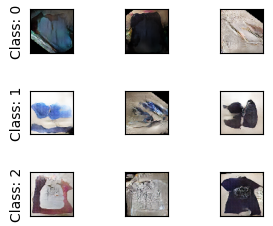

Epoch: 106 -- G_Loss: 1.0648157596588135, D_Loss: 1.1564853191375732

Took 19.47726559638977 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.31it/s]


1/1 [==============================] - 0s 28ms/step


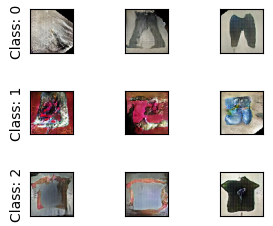

Epoch: 107 -- G_Loss: 1.0642344951629639, D_Loss: 1.1680054664611816

Took 19.51666021347046 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 36ms/step


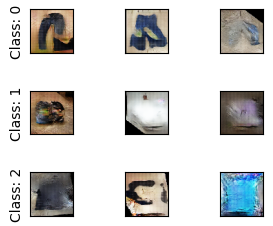

Epoch: 108 -- G_Loss: 1.1196460723876953, D_Loss: 1.1691370010375977

Took 21.743814706802368 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.14it/s]


1/1 [==============================] - 0s 39ms/step


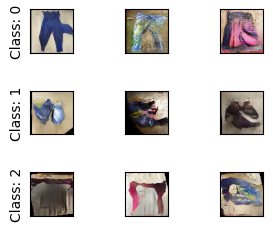

Epoch: 109 -- G_Loss: 1.1753331422805786, D_Loss: 1.1665935516357422

Took 18.68170714378357 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.44it/s]


1/1 [==============================] - 0s 34ms/step


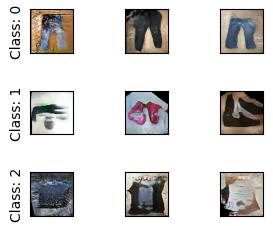

Epoch: 110 -- G_Loss: 1.0659252405166626, D_Loss: 1.161657691001892

Took 21.213006734848022 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.76it/s]


1/1 [==============================] - 0s 33ms/step


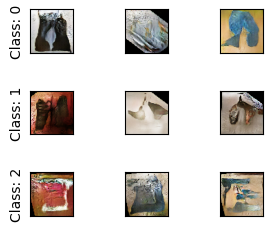

Epoch: 111 -- G_Loss: 1.0585557222366333, D_Loss: 1.1710903644561768

Took 20.664037704467773 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.84it/s]


1/1 [==============================] - 0s 31ms/step


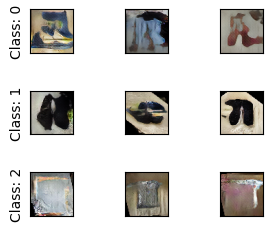

Epoch: 112 -- G_Loss: 1.0735063552856445, D_Loss: 1.1669200658798218

Took 18.902773141860962 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.42it/s]


1/1 [==============================] - 0s 26ms/step


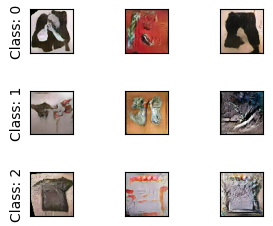

Epoch: 113 -- G_Loss: 1.0885088443756104, D_Loss: 1.1637427806854248

Took 19.264562606811523 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.78it/s]


1/1 [==============================] - 0s 62ms/step


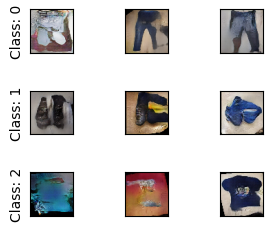

Epoch: 114 -- G_Loss: 1.0897362232208252, D_Loss: 1.1785712242126465

Took 20.766464471817017 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.87it/s]


1/1 [==============================] - 0s 34ms/step


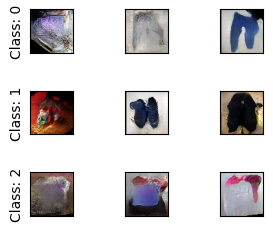

Epoch: 115 -- G_Loss: 1.123703956604004, D_Loss: 1.1728947162628174

Took 20.68110466003418 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 30ms/step


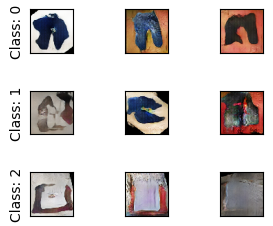

Epoch: 116 -- G_Loss: 1.0636740922927856, D_Loss: 1.1657358407974243

Took 21.379377603530884 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 30ms/step


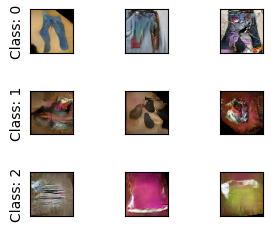

Epoch: 117 -- G_Loss: 1.0910251140594482, D_Loss: 1.1647719144821167

Took 21.362385988235474 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 25ms/step


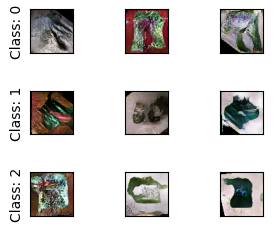

Epoch: 118 -- G_Loss: 1.060194730758667, D_Loss: 1.1860997676849365

Took 21.307054042816162 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 13.31it/s]


1/1 [==============================] - 0s 40ms/step


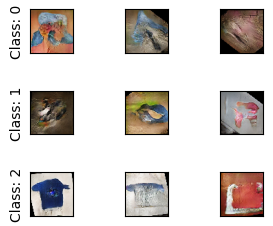

Epoch: 119 -- G_Loss: 1.0772041082382202, D_Loss: 1.1768110990524292

Took 18.594104766845703 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 28ms/step


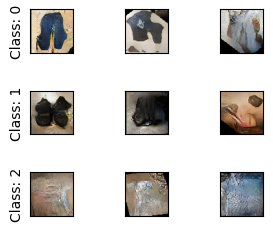

Epoch: 120 -- G_Loss: 1.0607235431671143, D_Loss: 1.1803596019744873

Took 21.383031606674194 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.13it/s]


1/1 [==============================] - 0s 29ms/step


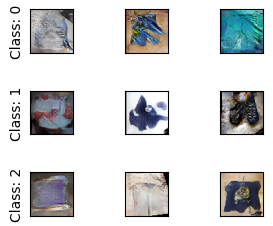

Epoch: 121 -- G_Loss: 1.0565613508224487, D_Loss: 1.1853870153427124

Took 21.358917713165283 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 28ms/step


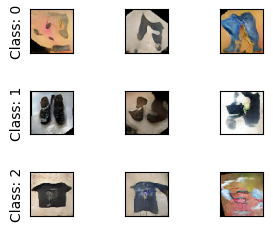

Epoch: 122 -- G_Loss: 1.0581914186477661, D_Loss: 1.1782222986221313

Took 21.369608163833618 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.66it/s]


1/1 [==============================] - 0s 50ms/step


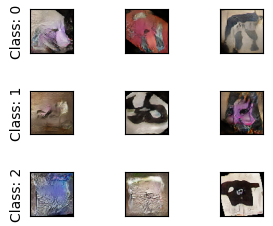

Epoch: 123 -- G_Loss: 1.0643423795700073, D_Loss: 1.1865100860595703

Took 19.788198471069336 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.60it/s]


1/1 [==============================] - 0s 37ms/step


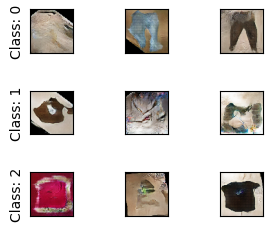

Epoch: 124 -- G_Loss: 1.1032270193099976, D_Loss: 1.1866310834884644

Took 19.396581649780273 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.82it/s]


1/1 [==============================] - 0s 29ms/step


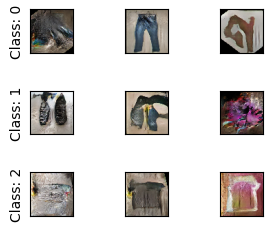

Epoch: 125 -- G_Loss: 1.0974040031433105, D_Loss: 1.1703721284866333

Took 19.04160737991333 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.98it/s]


1/1 [==============================] - 0s 38ms/step


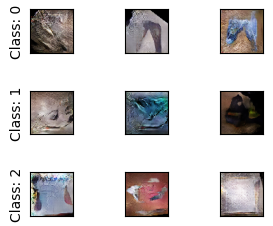

Epoch: 126 -- G_Loss: 1.0438264608383179, D_Loss: 1.181334137916565

Took 20.215020656585693 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.99it/s]


1/1 [==============================] - 0s 44ms/step


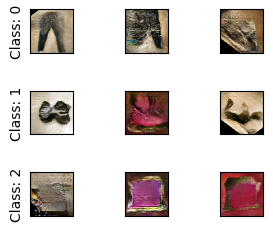

Epoch: 127 -- G_Loss: 1.05704927444458, D_Loss: 1.1824134588241577

Took 20.242373943328857 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.39it/s]


1/1 [==============================] - 0s 33ms/step


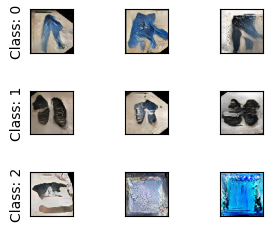

Epoch: 128 -- G_Loss: 1.111377239227295, D_Loss: 1.1915502548217773

Took 21.004607677459717 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.53it/s]


1/1 [==============================] - 0s 30ms/step


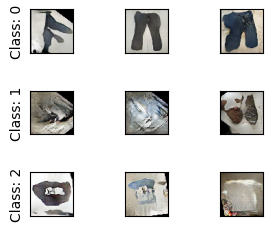

Epoch: 129 -- G_Loss: 1.0352329015731812, D_Loss: 1.1869639158248901

Took 21.561583042144775 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.07it/s]


1/1 [==============================] - 0s 40ms/step


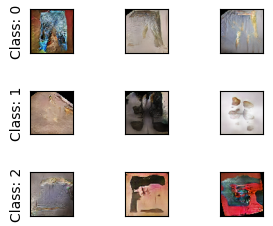

Epoch: 130 -- G_Loss: 1.0515888929367065, D_Loss: 1.1930011510849

Took 20.266139268875122 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 28ms/step


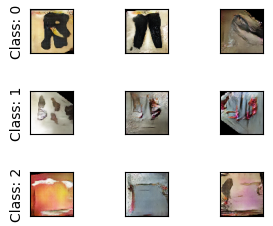

Epoch: 131 -- G_Loss: 1.0536370277404785, D_Loss: 1.1892352104187012

Took 21.535606861114502 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.93it/s]


1/1 [==============================] - 0s 32ms/step


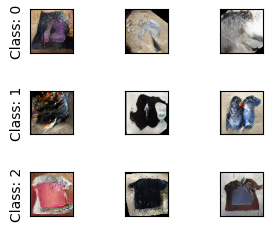

Epoch: 132 -- G_Loss: 1.0628646612167358, D_Loss: 1.1932603120803833

Took 20.44859552383423 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.96it/s]


1/1 [==============================] - 0s 43ms/step


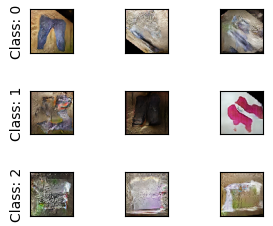

Epoch: 133 -- G_Loss: 1.03416109085083, D_Loss: 1.1871825456619263

Took 20.39165425300598 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.05it/s]


1/1 [==============================] - 0s 35ms/step


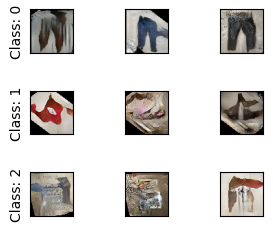

Epoch: 134 -- G_Loss: 1.0502344369888306, D_Loss: 1.203169822692871

Took 20.086212396621704 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.91it/s]


1/1 [==============================] - 0s 39ms/step


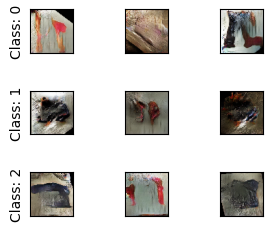

Epoch: 135 -- G_Loss: 1.0461034774780273, D_Loss: 1.1901742219924927

Took 20.36424970626831 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 49ms/step


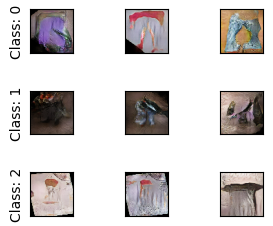

Epoch: 136 -- G_Loss: 1.0695019960403442, D_Loss: 1.1970099210739136

Took 22.113342761993408 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:17<00:00, 12.70it/s]


1/1 [==============================] - 0s 42ms/step


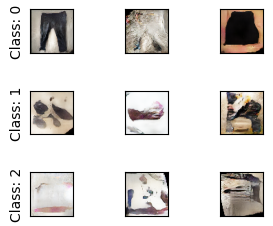

Epoch: 137 -- G_Loss: 1.0023049116134644, D_Loss: 1.1990752220153809

Took 19.239792823791504 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.15it/s]


1/1 [==============================] - 0s 45ms/step


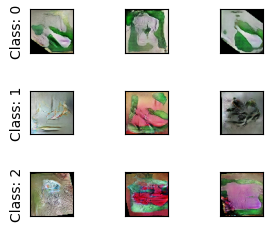

Epoch: 138 -- G_Loss: 1.0855543613433838, D_Loss: 1.2043304443359375

Took 19.96206307411194 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.87it/s]


1/1 [==============================] - 0s 43ms/step


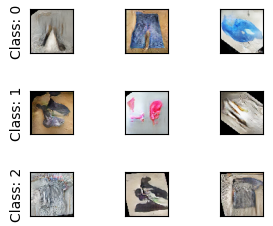

Epoch: 139 -- G_Loss: 1.0711787939071655, D_Loss: 1.1859074831008911

Took 20.409902095794678 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.04it/s]


1/1 [==============================] - 0s 28ms/step


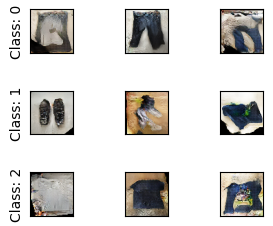

Epoch: 140 -- G_Loss: 1.0222831964492798, D_Loss: 1.2097840309143066

Took 19.921685218811035 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.63it/s]


1/1 [==============================] - 0s 31ms/step


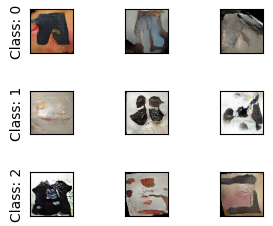

Epoch: 141 -- G_Loss: 1.0530260801315308, D_Loss: 1.2112563848495483

Took 20.651988983154297 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.70it/s]


1/1 [==============================] - 0s 30ms/step


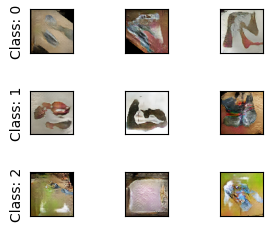

Epoch: 142 -- G_Loss: 1.0666877031326294, D_Loss: 1.2104109525680542

Took 20.491464376449585 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.14it/s]


1/1 [==============================] - 0s 48ms/step


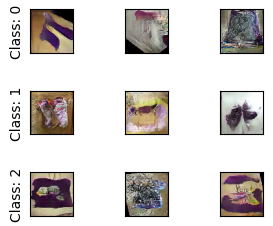

Epoch: 143 -- G_Loss: 1.035843849182129, D_Loss: 1.2023727893829346

Took 21.999265670776367 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:20<00:00, 11.19it/s]


1/1 [==============================] - 0s 62ms/step


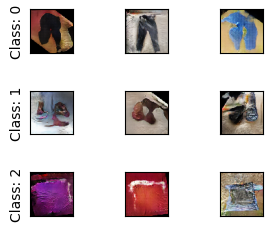

Epoch: 144 -- G_Loss: 1.077986240386963, D_Loss: 1.190757393836975

Took 21.74667739868164 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.60it/s]


1/1 [==============================] - 0s 34ms/step


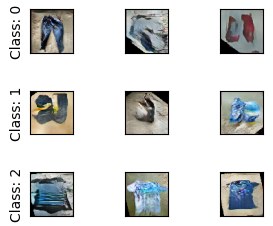

Epoch: 145 -- G_Loss: 0.9929746389389038, D_Loss: 1.197930097579956

Took 20.976500034332275 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:18<00:00, 12.01it/s]


1/1 [==============================] - 0s 30ms/step


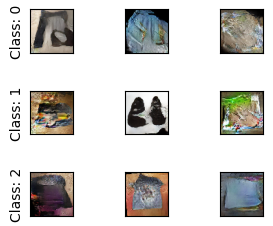

Epoch: 146 -- G_Loss: 1.0430046319961548, D_Loss: 1.205809235572815

Took 20.272959232330322 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.72it/s]


1/1 [==============================] - 0s 48ms/step


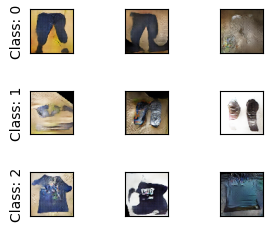

Epoch: 147 -- G_Loss: 1.0583897829055786, D_Loss: 1.1986664533615112

Took 20.656895637512207 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.97it/s]


1/1 [==============================] - 0s 33ms/step


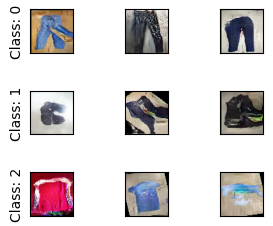

Epoch: 148 -- G_Loss: 1.026936411857605, D_Loss: 1.2018733024597168

Took 20.15593647956848 seconds. 


Epoch:  150


100%|██████████| 228/228 [00:19<00:00, 11.81it/s]


1/1 [==============================] - 0s 33ms/step


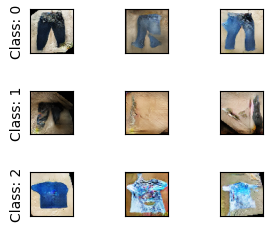

Epoch: 149 -- G_Loss: 1.0222759246826172, D_Loss: 1.2020663022994995

Took 20.560046434402466 seconds. 




In [30]:
train(train_dataset, epochs=150)

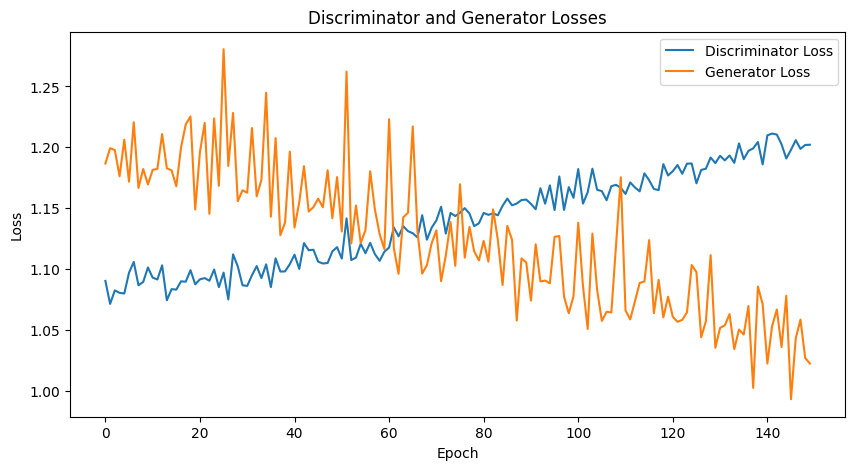

In [31]:
import matplotlib.pyplot as plt

# Plot the discriminator and generator losses
plt.figure(figsize=(10, 5))
plt.plot(d_losses, label='Discriminator Loss')
plt.plot(g_losses, label='Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Discriminator and Generator Losses')
plt.legend()
plt.show()

In [32]:
# Save the trained generator model
g_model.save('generator_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [33]:
# Load the trained generator model
loaded_model = tf.keras.models.load_model('generator_model.h5')

# Output Visualization

1/1 [==============================] - 0s 20ms/step


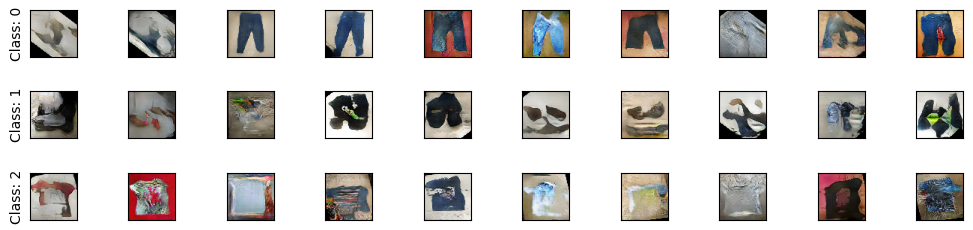

In [36]:
# Generate samples using the loaded generator model
show_samples(10,3, loaded_model)

1/1 [==============================] - 0s 20ms/step


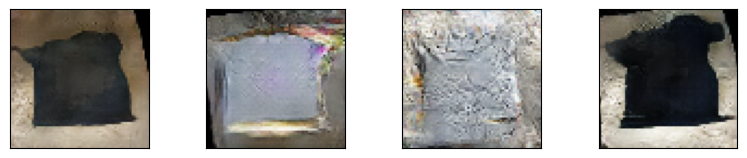

In [78]:
import numpy as np

def show_samples(image, label, num_samples, g_model):
    fig, axes = plt.subplots(1, num_samples, figsize=(2*num_samples, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=None, hspace=0.05)

    # Generate samples of the same class as the input label
    random_noise = tf.random.normal(shape=(num_samples, latent_dim))
    label = tf.ones(num_samples) * label
    gen_imgs = g_model.predict([random_noise, label])

    for j in range(num_samples):
        # Ensure pixel values are within the valid range [0, 1]
        gen_imgs[j] = (gen_imgs[j] + 1.0) / 2.0

        # Plot the generated image
        axes[j].imshow(gen_imgs[j])
        axes[j].yaxis.set_ticks([])
        axes[j].xaxis.set_ticks([])

    plt.show()

show_samples('img.jpg', 2, 4, g_model)

In [5]:
# import tensorflow as tf
# import os
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import LabelEncoder

# # Define the directory containing the images
# image_dir = "augmented_images"

# # Assuming labels_df contains the DataFrame with image labels

# # Split the images and labels into training, validation, and test sets
# train_labels, temp_labels = train_test_split(labels_df, test_size=0.15, random_state=42)
# val_labels, test_labels = train_test_split(temp_labels, test_size=0.5, random_state=42)

# # Extract image paths corresponding to each set
# train_image_paths = [os.path.join(image_dir, name+'.jpg') for name in train_labels['image']]
# val_image_paths = [os.path.join(image_dir, name+'.jpg') for name in val_labels['image']]
# test_image_paths = [os.path.join(image_dir, name+'.jpg') for name in test_labels['image']]

# # Print original class labels before encoding
# print("Original class labels:")
# print(train_labels['label'].unique())

# # Initialize the label encoder
# label_encoder = LabelEncoder()

# # Fit label encoder and transform labels to numerical format
# train_labels_encoded = label_encoder.fit_transform(train_labels['label'])
# val_labels_encoded = label_encoder.transform(val_labels['label'])
# test_labels_encoded = label_encoder.transform(test_labels['label'])

# # Number of unique classes
# num_classes = len(label_encoder.classes_)

# # Print original class labels after encoding
# print("\nEncoded class labels:")
# for idx, class_label in enumerate(label_encoder.classes_):
#     print(f"{class_label}: {idx}")

# # Create batches of images and labels for training, validation, and test sets
# batch_size = 32
# # print(num_classes)

Original class labels:
['Shoes' 'Pants' 'T-shirt']

Encoded class labels:
Pants: 0
Shoes: 1
T-shirt: 2
